# GPT-prompted Wolfram|Alpha for grounding and reasoning

In this Jupyter notebook, we will explore the potential of integrating ChatGPT with a computational knowledge engine like Wolfram|Alpha.
We will design a pipeline that takes a query, generated a prompt to Wolfram|Alpha using GPT, uses that prompt to query Wolfram|Alpha, and then uses the response to generate a response to the original query. This flow is illustrated in the following diagram:

$$
\text{GPT} \rightarrow \text{Wolfram|Alpha} \rightarrow \text{GPT}
$$

This "dance" between Large Language Models and Knowledge Engines is going to be ubiquitous in the future of AI. Let's have a glance of it!

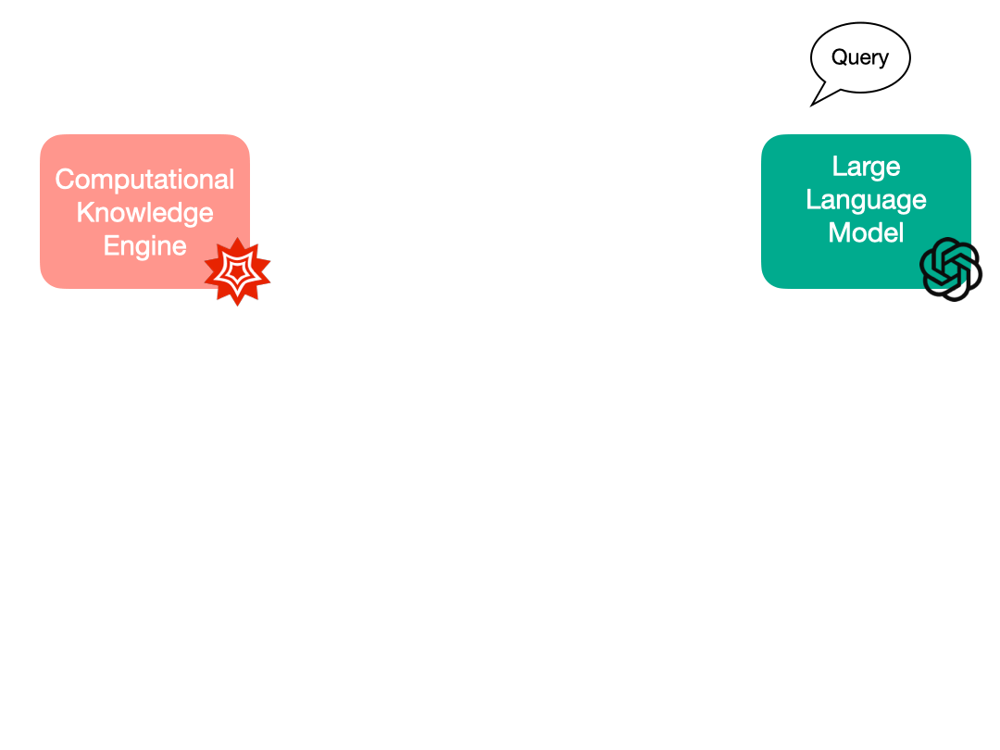

In [50]:
# Import the GIF
from IPython.display import Image
Image("./prompted_animation.gif")

Before we start, you will need to get an API key from Wolfram|Alpha and OpenAI.
Go to
<a href="https://developer.wolframalpha.com/portal/myapps/">Wolfram|Alpha</a>
and
<a href="https://beta.openai.com/">OpenAI</a>
to get your API keys.
Add your keys to your environment variables as `OPENAI_API_KEY` and `WOLFRAM_API_KEY`.
```bash
export OPENAI_API_KEY="YOUR_OPENAI_API_KEY"
export WOLFRAMALPHA_API_KEY="YOUR_WOLFRAMALPHA_API_KEY"
```

After that, you can install the required packages with :

In [56]:
# !pip3 install wolframalpha
# !pip3 install openai

Import packages :

In [1]:
from pprint import pprint # pretty print
import requests # for making HTTP requests
import os # for getting environment variables
import urllib.parse # for encoding the query
import openai # openai API
import wolframalpha # wolframalpha API
import matplotlib.pyplot as plt # for plotting
from PIL import Image # for image manipulation
import textwrap # for wrapping text

In [40]:
%run utils.py

Get the API keys from your environment variables and set them to variables :

In [3]:
# Read the API key from the environment variable
openai_app_id = os.environ['OPENAI_API_KEY']
wolframalpha_app_id = os.environ['WOLFRAMALPHA_API_KEY']

Make the WolframAlpha client. This will be used to query Wolfram|Alpha for data and visuals.

In [4]:
def wolframAlpha_client(query: str, includeplot : bool = False) -> str:
    """ Get the answer from WolframAlpha 
    Args:
        query (str): The query to ask WolframAlpha
    Returns:
        str: The answer from WolframAlpha
    """
    # Encode the query
    query = urllib.parse.quote_plus(query)
    # Make the request
    query_url = f"http://api.wolframalpha.com/v2/query?" \
                f"appid={wolframalpha_app_id}" \
                f"&input={query}" \
                f"&output=json"
    if includeplot :
        query_url += f"&includepodid=Plot"           
    # Get the response
    report_json = requests.get(query_url).json()
    # Return the answer
    return report_json

Make the OpenAI client. This will be used to query OpenAI for the GPT-3 completion.

In [5]:
def gpt_client(prompt: str, max_tokens : int) -> str:
    """  Get the answer from GPT-3
    Args:
        query (str): The query to ask GPT-3
    Returns:
        str: The answer from GPT-3
    """
    ## Call the API key under your account (in a secure way)
    openai.api_key = openai_app_id
    response = openai.Completion.create(
        engine="text-davinci-003", # the model
        prompt =  prompt, # the prompt
        temperature = 0.0, # temperature : the higher the temperature, the more random the output
        top_p = 1, # the top_p, 1 means no sampling
        max_tokens = max_tokens, # the max number of tokens to generate
        frequency_penalty = 0, # the frequency penalty
        presence_penalty = 0 # the presence penalty
    )
    # Return the answer
    return response.choices[0].text

Now we can start the fun part! 
We will start by using the Wolfram|Alpha client to get the raw data and visuals for a given query.
After some post-processing (the tools are available in this repository), we can use the information to create a prompt for GPT-3 to generate an elaborated response.
Finally, we will merge the response from GPT-3 and the images from Wolfram|Alpha to create a report.

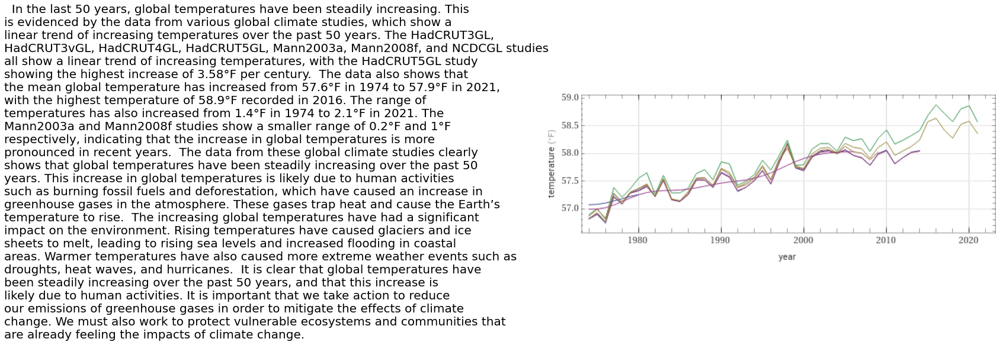

In [32]:
query = 'analyze global temperature in the last 50 years'
prompt = "Write a WolframAlpha prompt for : " + query.capitalize()
gpt_prompt = gpt_client(prompt,50).strip().replace('"', '')
report_json = wolframAlpha_client(gpt_prompt)
report_prompt = wolframAlpha_report(report_json)
prompt = query.capitalize() + ".\n" + "Write an essay.\n" + "Use this data:\n" + report_prompt["report"] +"\nDo not show tables."
gpt_output = gpt_client(prompt, 1264)
show_text_and_image(gpt_output, report_prompt["imgs_files"])


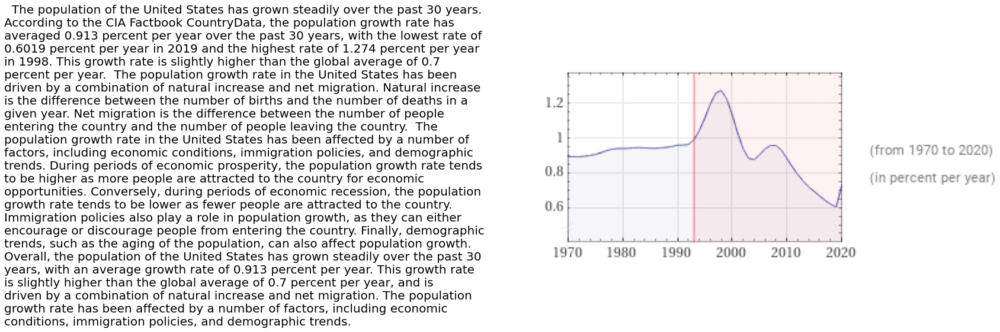

In [42]:
query = 'analyze us population in the last 30 years'
prompt = "Write a WolframAlpha prompt for : " + query.capitalize()
gpt_prompt = gpt_client(prompt,50).strip().replace('"', '')
report_json = wolframAlpha_client(gpt_prompt)
report_prompt = wolframAlpha_report(report_json)
prompt = query.capitalize() + ".\n" + "Write an essay.\n" + "Use this data:\n" + report_prompt["report"] +"\nDo not show tables."
gpt_output = gpt_client(prompt, 1264)
show_text_and_image(gpt_output, report_prompt["imgs_files"])

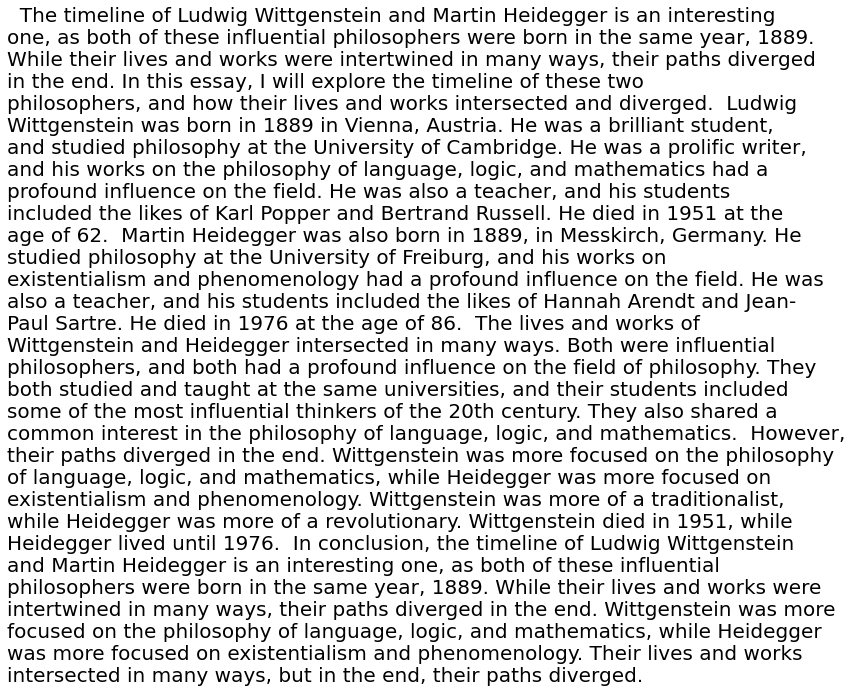

In [59]:
query = "Wittgenstein and Heidegger timeline"
prompt = "Write a WolframAlpha prompt for : " + query.capitalize()
gpt_prompt = gpt_client(prompt,50).strip().replace('"', '')
report_json = wolframAlpha_client(gpt_prompt)
report_prompt = wolframAlpha_report(report_json)
prompt = query.capitalize() + ".\n" + "Write an essay.\n" + "Use this data:\n" + report_prompt["report"] +"\nDo not show tables."
gpt_output = gpt_client(prompt, 1264)
show_text_and_image(gpt_output, report_prompt["imgs_files"])